**Time required to run the code: 21 hours**

### Import Library

In [55]:
# Import library
import warnings
warnings.filterwarnings('ignore')
import torch
import transformers
import torchvision
import torch.nn as nn
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pack_padded_sequence
import cv2
import time
import math
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm.autonotebook import tqdm
from IPython.display import clear_output
from sklearn.model_selection import train_test_split
from nltk.translate.bleu_score import SmoothingFunction
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu
from rouge import Rouge
import evaluate
import editdistance
from torchsummary import summary

In [2]:
# use cuda if available
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Currently using "{device.upper()}" device')

Currently using "CUDA" device


### Data Preparation

In [3]:
seed = 42
torch.random.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)

In [4]:
# define constant and tokenizer
tokenizer = transformers.BertTokenizer.from_pretrained("bert-base-uncased", do_lower_case=True) # convert all text to lower case in tokenization
MAX_SEQ_LEN = 120  
IMAGE_SIZE = 32
BATCH_SIZE = 32   
VOCAB_SIZE = tokenizer.vocab_size

In [5]:
# clear cuda memory
torch.cuda.empty_cache()

In [6]:
# load data
data = np.zeros((158916, 3), dtype=np.object)
i = 0
with open('captions.txt', 'r', encoding='utf-8') as file:
    for line in file:
        data[i, :] = line.replace('\n', "").split('|')
        i += 1

In [7]:
df = pd.DataFrame(data=data[1:, :], columns=data[0, :])
df.sample(5)

,image_name,caption_number,caption_text
138302,5797756884.jpg,2,A man is sitting on an upturned white bucket p...
1325,109260218.jpg,0,Spelunkers pose inside a rock cavern while bat...
130789,5087543347.jpg,4,A toddler enjoying her birthday cake .
101814,450596617.jpg,4,Two people are walking by the ocean .
22387,226481576.jpg,2,"Young , smiling , blond female police officer ..."


### Data Preprocessing

In [8]:
# train transformation
train_transforms = T.Compose([
                              T.ToPILImage(),
                              T.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                              T.RandomCrop(IMAGE_SIZE),
                              T.ColorJitter(brightness=(0.95, 1.05),
                                            contrast=(0.95, 1.05),
                                            saturation=(0.98, 1.02),
                                            hue=0.05),
                              T.RandomHorizontalFlip(p=0.1),
                              T.GaussianBlur(kernel_size=(1, 3), sigma=(0.1, 0.5)),
                              T.RandomAdjustSharpness(sharpness_factor=1.2, p=0.2),
                              T.RandomRotation(degrees=(-5, 5)),
                              T.ToTensor(),
                              T.Normalize(mean=[0.485, 0.456, 0.406], 
                                          std=[0.229, 0.224, 0.225])
])

In [9]:
# transformation for validation and test data
valid_transforms = T.Compose([
                              T.ToPILImage(),
                              T.Resize((IMAGE_SIZE, IMAGE_SIZE)),
                              T.ToTensor(),
                              T.Normalize(mean=[0.485, 0.456, 0.406], 
                                          std=[0.229, 0.224, 0.225])
])

In [10]:
root = 'images/flickr30k_images'

In [11]:
# create a custom dataset
class CustomDataset(Dataset):
    
    def __init__(self, df, root, tokenizer, transforms=None):
        self.df = df
        self.root = root
        self.tokenizer = tokenizer
        self.transforms = transforms

    def __len__(self):
        return len(self.df) # return len of dataaset

    def __getitem__(self, ix):
        row = self.df.iloc[ix].squeeze()
        id = row.image_name
        image_path = f'{self.root}/{id}'

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        caption = row.caption_text
        
        if isinstance(caption, str):
            caption = [caption]
        
        # use tokenizer to encode a batch of captions
        target = self.tokenizer.batch_encode_plus(
            caption, 
            return_token_type_ids=False, 
            return_attention_mask=False, 
            max_length=MAX_SEQ_LEN, 
            padding="do_not_pad",
            return_tensors="pt") # output in PyTorch tensor
        target = target['input_ids'].squeeze()
        target = torch.LongTensor(target)
        
        return image, target, caption # return preprocessed image, encoded target caption, and orginal caption

    def collate_fn(self, batch):
        batch.sort(key=lambda x: len(x[1]), reverse=True) # sorts batch from longest to shortest
        images, targets, captions = zip(*batch)
        images = torch.stack([self.transforms(image) for image in images], 0) # apply transformation
        lengths = [len(tar) for tar in targets]
        _targets = torch.zeros(len(captions), max(lengths)).long()
        for i, tar in enumerate(targets):
            end = lengths[i]
            _targets[i, :end] = tar[:end] 
        _targets = _targets.permute(1,0)
        
        # return batch of images, encoded taget captions and length of each caption
        return images.to(device), _targets.to(device), torch.tensor(lengths).long().to(device)

In [12]:
train_data, test_data = train_test_split(df, test_size=0.01, shuffle=True, random_state=42)
train_data, valid_data = train_test_split(train_data, test_size=0.1, shuffle=True, random_state=42)

In [13]:
train_data.reset_index(drop=True, inplace=True)
valid_data.reset_index(drop=True, inplace=True)
test_data.reset_index(drop=True, inplace=True)

In [14]:
print(f'Size of train dataset: {train_data.shape[0]}')
print(f'Size of validation dataset: {valid_data.shape[0]}')
print(f'Size of test dataset: {test_data.shape[0]}')

Size of train dataset: 141592
Size of validation dataset: 15733
Size of test dataset: 1590


In [15]:
# Create train, valid, test data
train_dataset = CustomDataset(train_data, root, tokenizer, train_transforms)
valid_dataset = CustomDataset(valid_data, root, tokenizer, valid_transforms)
test_dataset = CustomDataset(test_data, root, tokenizer, valid_transforms)

In [16]:
# fit data into dataloader
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=train_dataset.collate_fn, drop_last=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=valid_dataset.collate_fn, drop_last=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=test_dataset.collate_fn)

### Build Transformer Model

In [17]:
LR = 5e-5 
HIDDEN = 512 
ENC_LAYERS = 4 
DEC_LAYERS = 4 
N_HEADS = 8 
DROPOUT = 0.2

In [18]:
class Encoder(nn.Module):
    def __init__(self, bb_name='resnet50', hidden=HIDDEN, pretrained=False):
        super(Encoder, self).__init__()
        self.backbone = torchvision.models.__getattribute__(bb_name)(pretrained=pretrained) # feature extractor only, no trainable parameter
        self.backbone.fc = nn.Conv2d(2048, hidden, 1)
    
    def forward(self, src):
        x = self.backbone.conv1(src)

        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)
        x = self.backbone.layer1(x)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x) 
        x = self.backbone.fc(x) 
        x = x.flatten(2) 
        x = x.permute(2,0,1)
        return x

In [19]:
class Transformer(nn.Module):
    def __init__(self, outtoken, hidden, enc_layers=1, dec_layers=1, nhead=1, dropout=0.1, pretrained=False):
        super(Transformer, self).__init__()
        self.backbone = Encoder(pretrained=pretrained)
        
        self.pos_emb = nn.Embedding.from_pretrained(self.get_position_embedding_table(), freeze=True) ##
        self.pos_encoder = PositionalEncoding(hidden, dropout)
        self.decoder = nn.Embedding(outtoken, hidden, padding_idx=0)
        self.pos_decoder = PositionalEncoding(hidden, dropout)
        self.transformer = nn.Transformer(d_model=hidden, nhead=nhead, num_encoder_layers=enc_layers,
                                          num_decoder_layers=dec_layers, dim_feedforward=hidden * 4, dropout=dropout,
                                          activation='gelu')

        self.fc_out = nn.Linear(hidden, outtoken)
        self.src_mask = None
        self.trg_mask = None
        self.memory_mask = None
    
    # generate position embedding table that contains positional encoding angles for each position in image grid
    def get_position_embedding_table(self, num_pix=8, ch_pos=256): 
        
        def cal_angle(position, hid_idx):
            x = position % num_pix
            y = position // num_pix
            x_enc = x / np.power(10000, hid_idx / ch_pos)
            y_enc = y / np.power(10000, hid_idx / ch_pos)
            return np.sin(x_enc), np.sin(y_enc)
        
        # get the positional encoding angles for a given position across all hidden indices
        def get_posi_angle_vec(position):
            return [cal_angle(position, hid_idx)[0] for hid_idx in range(ch_pos)] + [cal_angle(position, hid_idx)[1] for hid_idx in range(ch_pos)]
        
        # store the positional encoding angles for all positions
        embedding_table = np.array([get_posi_angle_vec(pos_i) for pos_i in range(int(num_pix**2))])
        return torch.FloatTensor(embedding_table).to(device)

    def generate_square_subsequent_mask(self, sz):
        
        mask = torch.triu(torch.ones(sz, sz), 1) # Create an upper triangular matrix of size sz x sz filled with ones
        mask = mask.masked_fill(mask == 1, float('-inf')) # Replace the ones in the mask with negative infinity
        return mask

    def make_len_mask(self, inp):
        return (inp == 0).transpose(0, 1)

    def forward(self, src, trg):
        
        if self.trg_mask is None or self.trg_mask.size(0) != len(trg):
            self.trg_mask = self.generate_square_subsequent_mask(len(trg)).to(device) 
        
        # Pass the source input through the backbone
        x = self.backbone(src)
        
        # Retrieve batch size and positions from the backbone output
        batch_size = x.size(1) 
        positions = x.size(0) 
        
        src_pad_mask = self.make_len_mask(x[:, :, 0]) # Create a source padding mask
        pos_emb = self.pos_emb(torch.LongTensor([list(range(positions))]*batch_size).to(device)) # Generate positional embeddings based on the number of positions
        src = x + pos_emb.permute(1,0,2) # Add positional embeddings to the source input
        
        trg_pad_mask = self.make_len_mask(trg) # Create a target padding mask
        # Pass the target input through the decoder and positional decoder
        trg = self.decoder(trg)
        trg = self.pos_decoder(trg)
        
        # Apply the transformer layer
        output = self.transformer(src, trg, src_mask=self.src_mask, tgt_mask=self.trg_mask,
                                  memory_mask=self.memory_mask,
                                  src_key_padding_mask=src_pad_mask, tgt_key_padding_mask=trg_pad_mask,
                                  memory_key_padding_mask=src_pad_mask) 
        output = self.fc_out(output) # fully-connected layer

        return output

In [20]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        self.scale = nn.Parameter(torch.ones(1))

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        # enhancement based on 'Attention is All You Need'
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-np.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.scale * self.pe[:x.size(0), :]
        return self.dropout(x) 

### Model Training and Evaluation

In [21]:
# function to train one batch of train data
def train_model(model, data, optimizer, criterion):
    
    model.train() # train model
    image, target, _ = data
    optimizer.zero_grad() # zero out gradient
    output = model(image, target[:-1, :]) # get the model output
    
    if torch.any(torch.isnan(output)): # unstable model 
        output = torch.nan_to_num(output)
    
    # compute loss
    loss = criterion(output.view(-1, output.shape[-1]), torch.reshape(target[1:, :], (-1,)))
    loss.backward() # backpropagation
    optimizer.step()
    
    torch.nn.utils.clip_grad_norm_(model.parameters(), 10.0) # prevent gradient to explode
    
    return loss.item()

In [22]:
# function to perform validation on one batch of validation dataset
@torch.no_grad()
def validate_model(model, data, criterion):
    
    model.eval() # evaluate model
    image, target, _ = data
    output = model(image, target[:-1, :])
    if torch.any(torch.isnan(output)):
        output = torch.nan_to_num(output)
    loss = criterion(output.view(-1, output.shape[-1]), torch.reshape(target[1:, :], (-1,)))
    
    return loss.item()

In [108]:
# function to make prediction on test dataset
@torch.no_grad()
def prediction(model, filepath='random', max_len=MAX_SEQ_LEN, tokenizer=tokenizer, plot=True):
    
    label = None
    if filepath == 'random':
        idx = np.random.randint(len(test_data))
        filepath = root + '/' + test_data.iloc[idx, 0]
        label = test_data.iloc[idx, -1]

    model.eval()
    img = cv2.imread(filepath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = valid_transforms(img)
    src = torch.FloatTensor(image).unsqueeze(0).to(device)

    out_indexes = [101, ]

    for i in range(max_len):
                
        trg_tensor = torch.LongTensor(out_indexes).unsqueeze(1).to(device) # convert our_indexes to tendor
                
        output = model(src, trg_tensor) # get output from model
        out_token = output.argmax(2)[-1].item() # find the index with highest probability, get the last element of the tensor as predicted token
        if out_token == 102: # if predicted token is end-of-sequence token, break
            break
        out_indexes.append(out_token)

    preds = tokenizer.decode(out_indexes[1:])
    if plot:
        plt.figure(figsize=(6,4))
        plt.title("Predicted / Truth")
        plt.imshow(img)
        plt.tight_layout()
        plt.show()
        plt.pause(0.001)
        print(f'Prediction: {preds}, \nTruth: {label if label is not None else "NO label"}')
    
    return preds

In [106]:
PATH = r'model.pth'

In [25]:
# intialize model
model = Transformer(VOCAB_SIZE, hidden=HIDDEN, enc_layers=ENC_LAYERS, dec_layers=DEC_LAYERS,   
                         nhead=N_HEADS, dropout=DROPOUT, pretrained=True).to(device)  

In [26]:
criterion = nn.CrossEntropyLoss(ignore_index=0)
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, min_lr=1e-6, factor=0.1)

1/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 1 summary:
Train loss: 4.2285, validation loss: 3.6370
Time per 1 epoch: 40.0 minutes
2/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 2 summary:
Train loss: 3.5523, validation loss: 3.3409
Time per 2 epoch: 167.0 minutes
Prediction after 2 epoch.


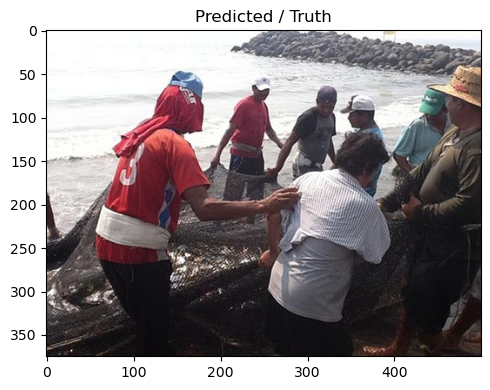

Prediction: a man in a white shirt and a black hat is standing in front of a building., 
Truth: group of people by the ocean holding a net
3/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 3 summary:
Train loss: 3.3177, validation loss: 3.1705
Time per 3 epoch: 206.0 minutes
4/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 4 summary:
Train loss: 3.1653, validation loss: 3.0630
Time per 4 epoch: 242.0 minutes
Prediction after 4 epoch.


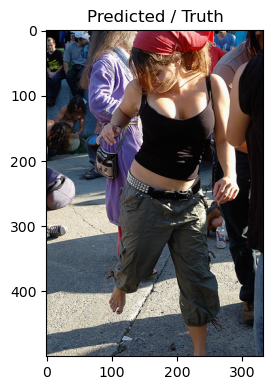

Prediction: a man in a blue shirt and blue jeans is standing in front of a crowd of people., 
Truth: A girl in a black tank with cargo shorts to what appears to be dancing with several people around .
5/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 5 summary:
Train loss: 3.0532, validation loss: 2.9811
Time per 5 epoch: 278.0 minutes
6/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 6 summary:
Train loss: 2.9620, validation loss: 2.9175
Time per 6 epoch: 313.0 minutes
Prediction after 6 epoch.


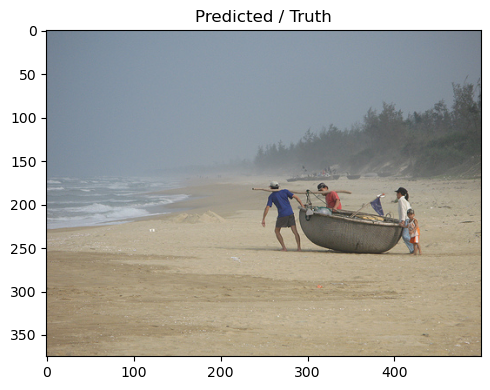

Prediction: a man is riding a bike on a dirt path., 
Truth: A family is at the beach with a sailboat .
7/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 7 summary:
Train loss: 2.8880, validation loss: 2.8626
Time per 7 epoch: 349.0 minutes
8/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 8 summary:
Train loss: 2.8219, validation loss: 2.8210
Time per 8 epoch: 385.0 minutes
Prediction after 8 epoch.


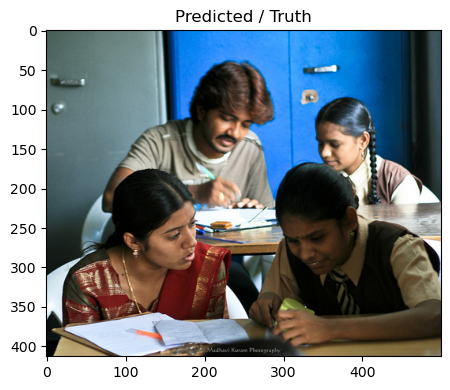

Prediction: a man in a black shirt is playing a guitar., 
Truth: Indian students working and in discussion in a classroom .
9/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 9 summary:
Train loss: 2.7648, validation loss: 2.7806
Time per 9 epoch: 421.0 minutes
10/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 10 summary:
Train loss: 2.7135, validation loss: 2.7500
Time per 10 epoch: 457.0 minutes
Prediction after 10 epoch.


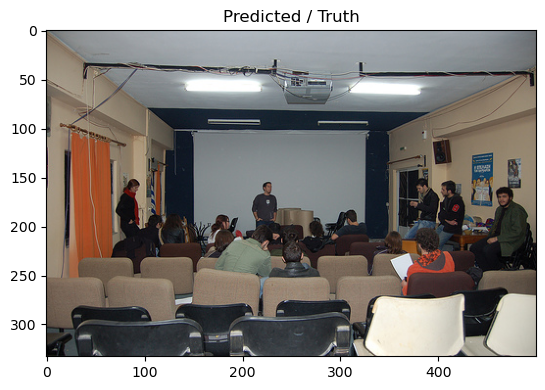

Prediction: a group of people are sitting at a table in a restaurant., 
Truth: A man with a blue shirt on is at the front of the room and several other people are sitting in chairs in the room .
11/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 11 summary:
Train loss: 2.6654, validation loss: 2.7237
Time per 11 epoch: 493.0 minutes
12/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 12 summary:
Train loss: 2.6230, validation loss: 2.7033
Time per 12 epoch: 529.0 minutes
Prediction after 12 epoch.


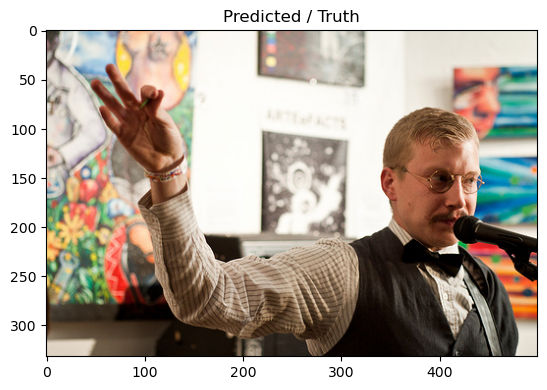

Prediction: a man in a white shirt is talking to a woman in a white shirt., 
Truth: This man is discussing something .
13/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 13 summary:
Train loss: 2.5817, validation loss: 2.6809
Time per 13 epoch: 566.0 minutes
14/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 14 summary:
Train loss: 2.5452, validation loss: 2.6614
Time per 14 epoch: 603.0 minutes
Prediction after 14 epoch.


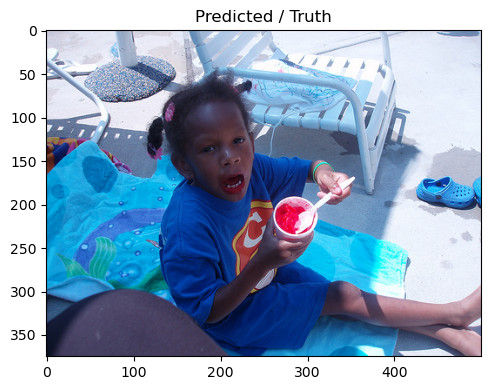

Prediction: a young girl in a pink shirt is holding a baby in a pink shirt., 
Truth: A little girl with a blue shirt on and eating some type of red drink .
15/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 15 summary:
Train loss: 2.5098, validation loss: 2.6442
Time per 15 epoch: 640.0 minutes
16/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 16 summary:
Train loss: 2.4763, validation loss: 2.6323
Time per 16 epoch: 676.0 minutes
Prediction after 16 epoch.


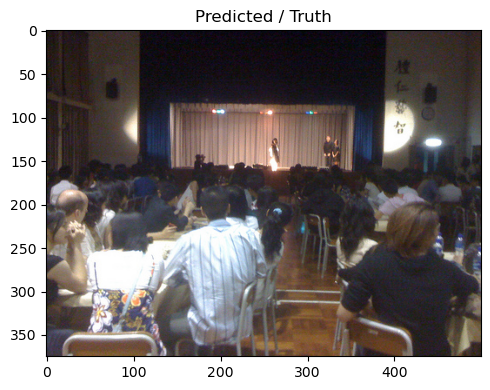

Prediction: a group of people are standing in a room with a large white wall., 
Truth: An audience watching a performance .
17/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 17 summary:
Train loss: 2.4452, validation loss: 2.6188
Time per 17 epoch: 712.0 minutes
18/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 18 summary:
Train loss: 2.4153, validation loss: 2.6101
Time per 18 epoch: 748.0 minutes
Prediction after 18 epoch.


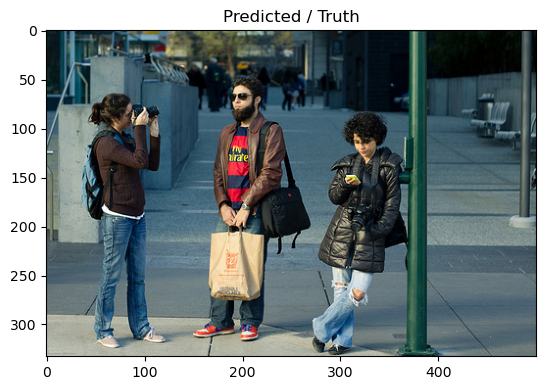

Prediction: a man in a blue shirt and a woman in a white shirt are walking down a street., 
Truth: A woman in a brown sweatshirt and jeans is taking a picture of a guy with a beard while another woman texts on her phone nearby .
19/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 19 summary:
Train loss: 2.3883, validation loss: 2.5982
Time per 19 epoch: 784.0 minutes
20/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 20 summary:
Train loss: 2.3620, validation loss: 2.6031
Time per 20 epoch: 824.0 minutes
Prediction after 20 epoch.


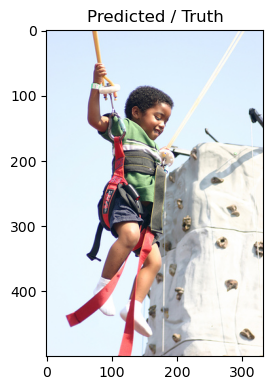

Prediction: a boy in a blue shirt is climbing a rock wall., 
Truth: A young boy in a green shirt is strapped in a harness climbing a rock wall .
21/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 21 summary:
Train loss: 2.3309, validation loss: 2.5863
Time per 21 epoch: 863.0 minutes
22/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 22 summary:
Train loss: 2.3093, validation loss: 2.5799
Time per 22 epoch: 906.0 minutes
Prediction after 22 epoch.


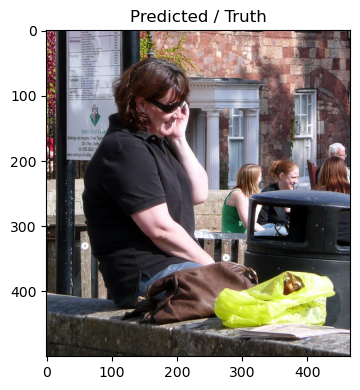

Prediction: a woman in a white shirt is sitting on a bench., 
Truth: A woman speaks on her cellphone with her purse and a yellow bag on the ledge next to her .
23/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 23 summary:
Train loss: 2.2870, validation loss: 2.5707
Time per 23 epoch: 941.0 minutes
24/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 24 summary:
Train loss: 2.2635, validation loss: 2.5699
Time per 24 epoch: 977.0 minutes
Prediction after 24 epoch.


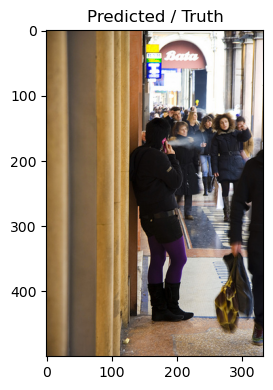

Prediction: a woman in a blue shirt and a man in a white shirt are walking down the street., 
Truth: A woman in purple tights is talking on the phone .
25/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 25 summary:
Train loss: 2.2419, validation loss: 2.5648
Time per 25 epoch: 1013.0 minutes
26/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 26 summary:
Train loss: 2.2214, validation loss: 2.5672
Time per 26 epoch: 1052.0 minutes
Prediction after 26 epoch.


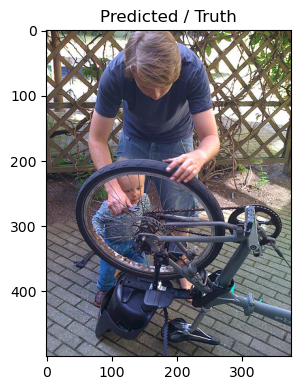

Prediction: a man in a blue shirt is fixing a bicycle tire., 
Truth: A man works on the rear tire of a bike while a baby looks on from behind the bike .
27/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 27 summary:
Train loss: 2.1993, validation loss: 2.5566
Time per 27 epoch: 1091.0 minutes
28/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 28 summary:
Train loss: 2.1829, validation loss: 2.5556
Time per 28 epoch: 1127.0 minutes
Prediction after 28 epoch.


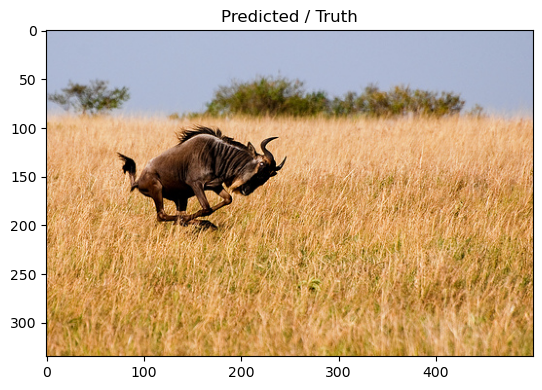

Prediction: a dog is running through a field of grass., 
Truth: An antelope runs through tall brown grass .
29/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 29 summary:
Train loss: 2.1561, validation loss: 2.5571
Time per 29 epoch: 1163.0 minutes
30/30 epoch.


  0%|          | 0/4424 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

Epoch 30 summary:
Train loss: 2.1409, validation loss: 2.5563
Time per 30 epoch: 1199.0 minutes
Prediction after 30 epoch.


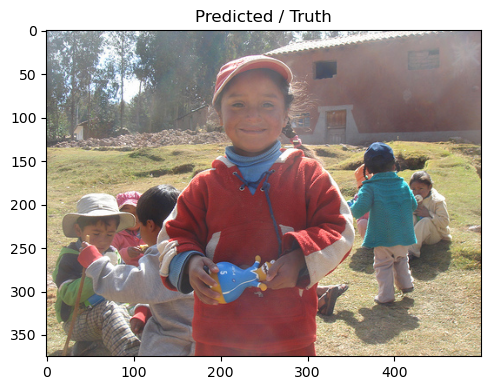

Prediction: a little girl in a pink shirt is playing with a balloon., 
Truth: A child in a red sweatshirt and hat holding a toy .


In [27]:
# training loop
EPOCHS = 30
train_losses, valid_losses = [], []
start_time = time.time()

counter = 0
best_val_loss = 10.0
epoch_used = 0

for epoch in range(EPOCHS):
    
    print(f'{epoch+1}/{EPOCHS} epoch.')
    epoch_train_losses, epoch_valid_losses = [], []
    train_track = tqdm(train_dataloader, total=len(train_dataloader), leave=True)
    
    # train model batch by batch
    for i, batch in enumerate(train_track):
        loss = train_model(model, batch, optimizer, criterion)
        epoch_train_losses.append(loss)
        train_track.set_postfix(loss=loss) # just a visual aids
        
    train_epoch_loss = np.array(epoch_train_losses).mean() # get loss mean of every batch
    train_losses.append(train_epoch_loss)
    
    validation_track = tqdm(valid_dataloader, total=len(valid_dataloader), leave=True)
    for _, batch in enumerate(validation_track):
        loss = validate_model(model, batch, criterion)
        epoch_valid_losses.append(loss)
        validation_track.set_postfix(loss=loss) # just a visual aids
        
    valid_epoch_loss = np.array(epoch_valid_losses).mean() # get loss mean of every batch
    valid_losses.append(valid_epoch_loss)
    
    # Perform early stopping to prevent overfitting, here we set the patience as 10
    if valid_epoch_loss < best_val_loss:
        counter = 0
        best_val_loss = valid_epoch_loss # update best validation loss
        torch.save(model.state_dict(), 'model.pth') # save the model
    else:
        counter += 1
        
    if counter == 5: # 5 patience is given before early stopping
        print("Early stopping triggered at epoch:", epoch)
        break # to terminate out the training loop
    
    # print out information of each epoch
    print(f'Epoch {epoch+1} summary:')
    print(f'Train loss: {train_epoch_loss:.4f}, validation loss: {valid_epoch_loss:.4f}')
    print(f'Time per {epoch+1} epoch: {(time.time() - start_time)//60} minutes')
    
    scheduler.step(valid_epoch_loss) # learning rate scheduler
    
    # try see the prediction performance as model is training
    if (epoch+1) % 2 == 0:
        print(f'Prediction after {epoch+1} epoch.')
        pred = prediction(model)
    
    epoch_used += 1
        

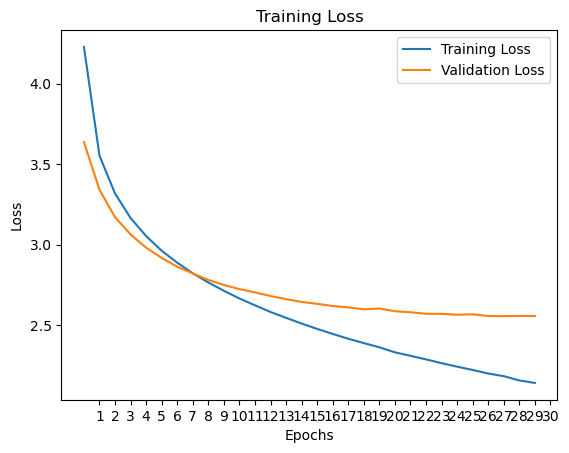

In [29]:
epoch_lst = list(range(1, epoch_used + 1))

# Plotting loss
plt.plot(train_losses, label='Training Loss')
plt.plot(valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.xticks(epoch_lst)
plt.legend()
plt.show()

### Test and Evaluate Model

In [40]:
# import our trained model
model = Transformer(VOCAB_SIZE, hidden=HIDDEN, enc_layers=ENC_LAYERS, dec_layers=DEC_LAYERS,   
                         nhead=N_HEADS, dropout=DROPOUT, pretrained=True).to(device)
model.load_state_dict(torch.load('model.pth'))
model = model.to(device)

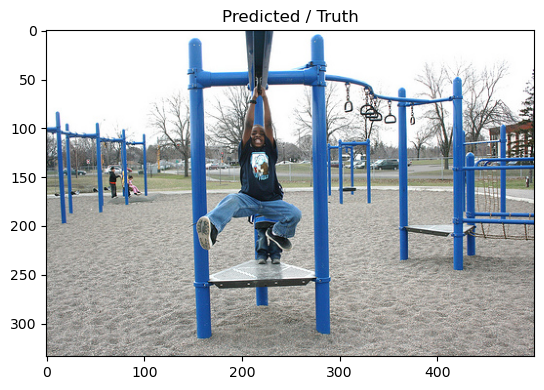

Prediction: a little boy is playing on a playground., 
Truth: A boys plays at the playground .


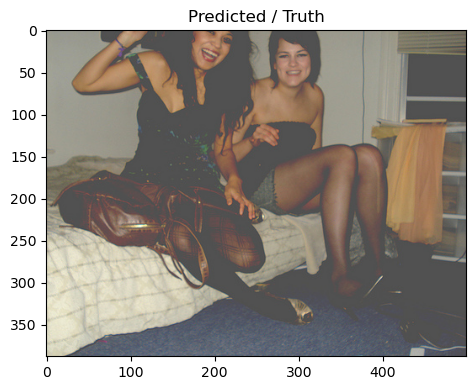

Prediction: two young girls are smiling and laughing., 
Truth: Two woman in dresses smiling at the camera .


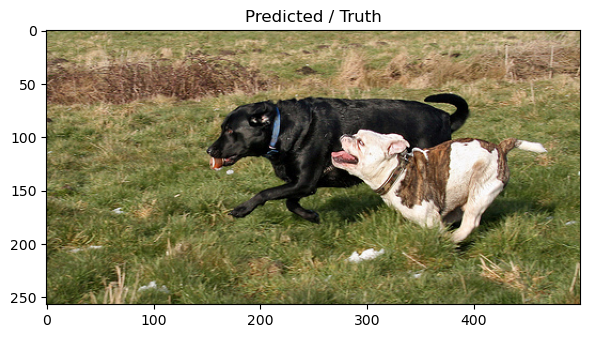

Prediction: a brown dog is running in the grass., 
Truth: Two dogs run through the grass .


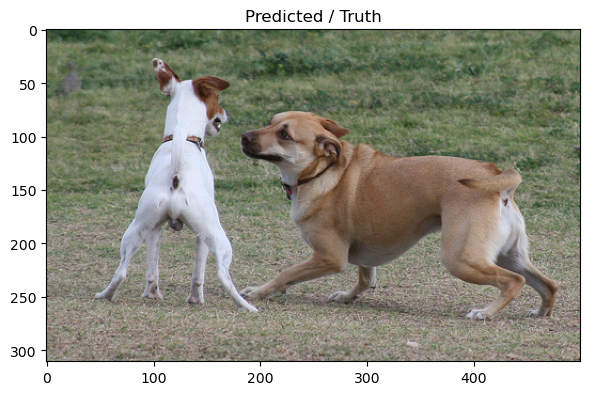

Prediction: a brown dog is playing with a white dog., 
Truth: A white dog and brown dog fighting .


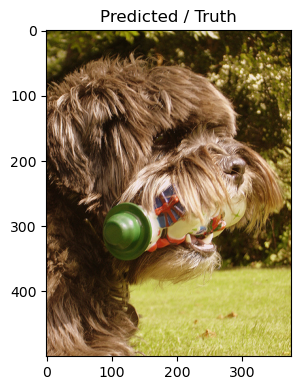

Prediction: a dog is chewing on a red toy., 
Truth: A shaggy dog with a toy in its mouth .


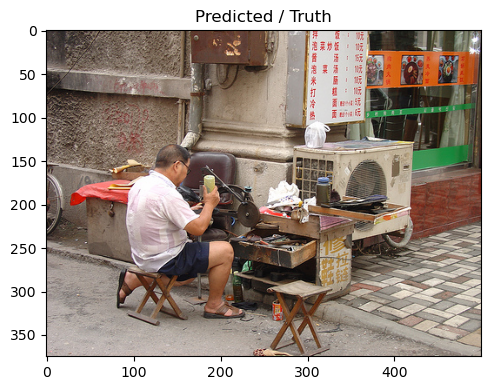

Prediction: a man in a blue shirt is sitting on a stool in front of a store., 
Truth: A chinese man wearing glasses sitting on a chair holding a green beverage .


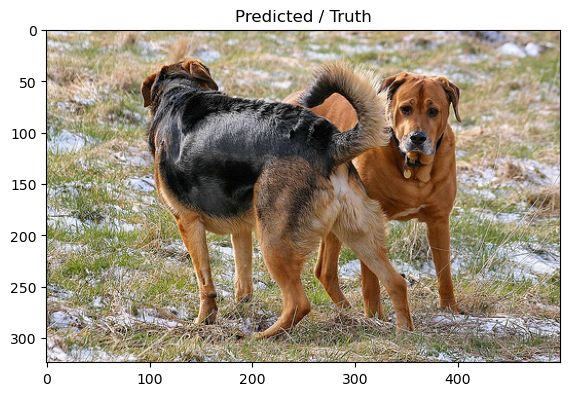

Prediction: a brown dog is biting a black dog., 
Truth: Two dogs are standing in a field of grass and dirt .


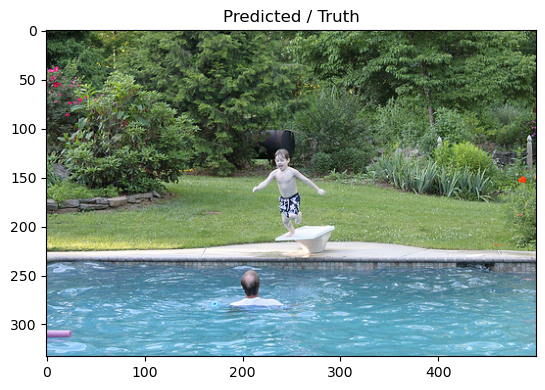

Prediction: a boy jumping into a pool., 
Truth: A little boy is jumping into the water from a platform .


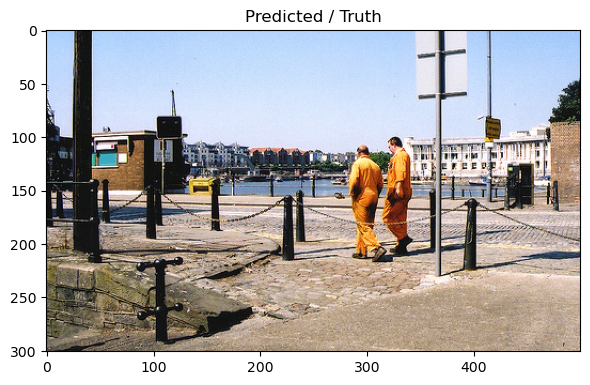

Prediction: two men in orange uniforms are walking down the street., 
Truth: Two men in orange jumpsuits walk down the street .


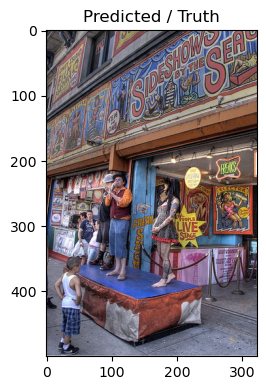

Prediction: a man in a red shirt is playing a drum set in front of a crowd of people., 
Truth: A boy watches a street performance with his hands on his hips .


In [123]:
# Set the number of predictions to generate
num_predictions = 10

# Call the prediction function multiple times
for _ in range(num_predictions):
    prediction(model, filepath='random', tokenizer=tokenizer)

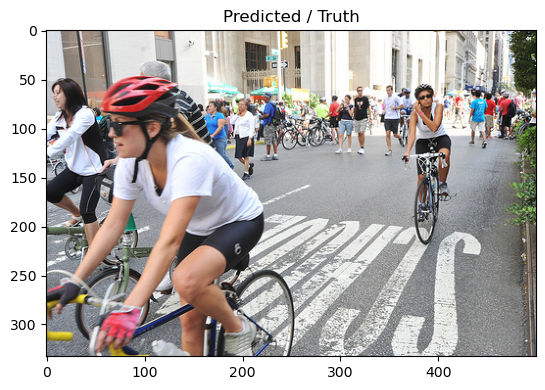

Prediction: a group of people riding bikes in a race., 
Truth: Women riding bikes on a city street .


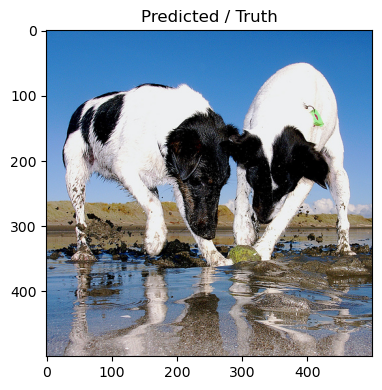

Prediction: two dogs are fighting over a stick., 
Truth: Two dogs fight over a ball that 's in a puddle .


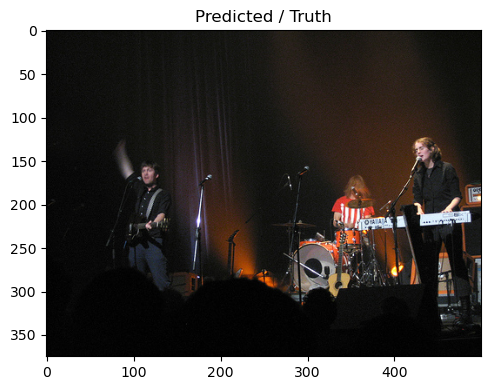

Prediction: a band is playing on stage., 
Truth: The three members of Hanson are performing at a concert .


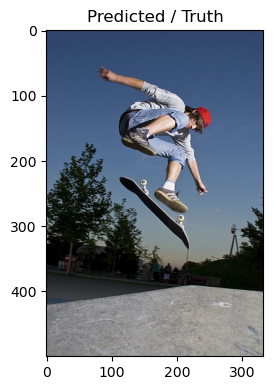

Prediction: a skateboarder is doing a trick on a ramp., 
Truth: A skateboarder is airborne above his inverted board .


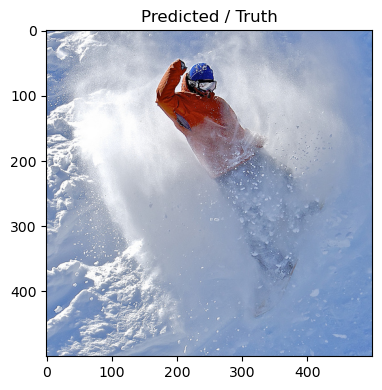

Prediction: a snowboarder in a red jacket is going down a snowy mountain., 
Truth: A man in a red jacket and goggles is skiing in a flurry of snow .


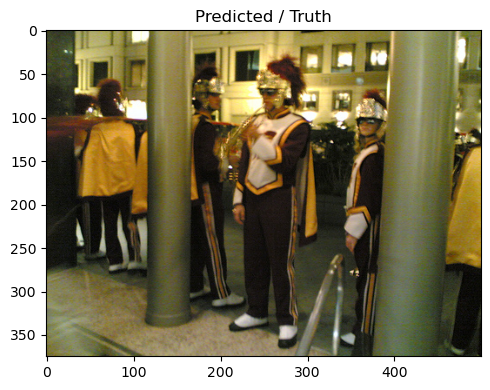

Prediction: a band is playing in a city square., 
Truth: Marching band standing in a public area .


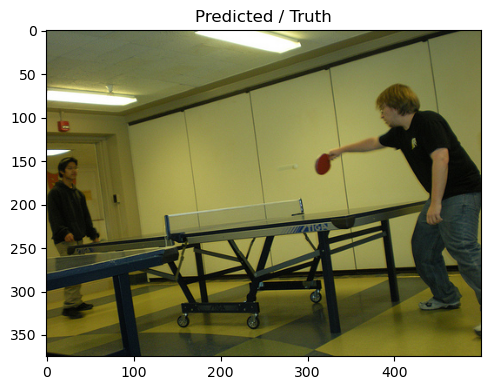

Prediction: two men are playing ping - pong., 
Truth: Two males play table tennis inside a building .


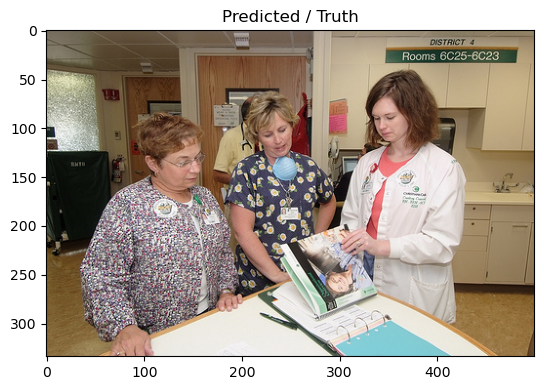

Prediction: three people are sitting at a table with a laptop and a laptop., 
Truth: Three women are working in a hospital .


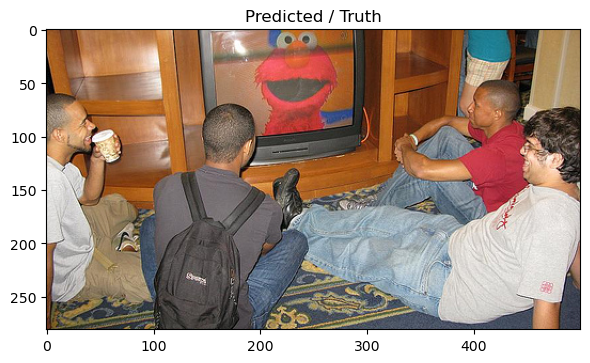

Prediction: a group of people are sitting around a table eating., 
Truth: Four young men sit on the floor close to a television that is showing Elmo from Sesame Street .


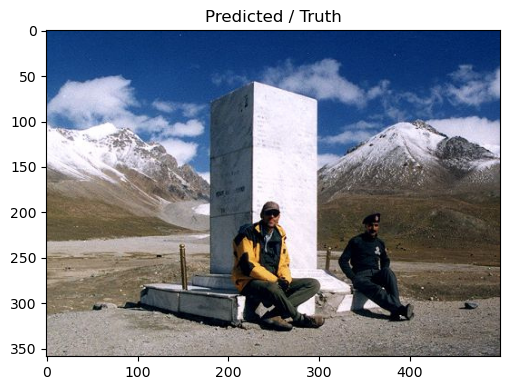

Prediction: two men are sitting on a rock in front of a mountain., 
Truth: Two men sit against a stone monument among snow covered peaks .


In [149]:
# Generate another 10
num_predictions = 10

# Call the prediction function multiple times
for _ in range(num_predictions):
    prediction(model, filepath='random', tokenizer=tokenizer)

### Model Testing and Evaluation

In [44]:
# BLEU score
def bleu_score_fn(method_no: int = 4, ref_type='corpus'):
    smoothing_method = getattr(SmoothingFunction(), f'method{method_no}')
    
    def bleu_score_corpus(reference_corpus: list, candidate_corpus: list, n: int = 4):
        weights = [1 / n] * n
        return corpus_bleu(reference_corpus, candidate_corpus,
                           smoothing_function=smoothing_method, weights=weights)

    def bleu_score_sentence(reference_sentences: list, candidate_sentence: list, n: int = 4):
        weights = [1 / n] * n
        return sentence_bleu(reference_sentences, candidate_sentence,
                             smoothing_function=smoothing_method, weights=weights)
    if ref_type == 'corpus':
        return bleu_score_corpus
    elif ref_type == 'sentence':
        return bleu_score_sentence

In [88]:
# ROUGE score
def rouge_score(candidate, reference):
    rouge = evaluate.load("rouge")
    scores = rouge.compute(predictions = candidate, references = reference)

    return scores

In [89]:
corpus_bleu_score_fn = bleu_score_fn(4, 'corpus')

In [233]:
# function to evaluate model on test dataset
@torch.no_grad()
def evaluation(dataloader, model, bleu_score_fn, tokenizer):
    
    running_bleu = [0.0] * 5
    
    rouge_1 = 0
    rouge_2 = 0
    rouge_L = 0
    rouge_Lsum = 0
    
    model.eval()
    
    for batch_idx, batch in enumerate(tqdm(dataloader, leave=False)):
        images, captions, _ = batch # unpack batch
        outputs = [] # list to store predicted captions
        
        for j in range(images.size(0)): # iterate over the images in batch
            src = images[j, ...].unsqueeze(0)
            out_indexes = [101, ]
            for i in range(MAX_SEQ_LEN):
                trg_tensor = torch.LongTensor(out_indexes).unsqueeze(1).to(device)      
                output = model(src, trg_tensor) # get output from model
                out_token = output.argmax(2)[-1].item() # Find the index with the highest probability in the output tensor along the third dimension.
                if out_token == 102:  # [SEP]
                    break
                out_indexes.append(out_token) # append predicted token to list
            # decode using tokenizer to obtain predicted captions
            preds = tokenizer.decode(out_indexes[1:]).replace('[PAD]', '').split()
            outputs.append(preds)
        
        # deocde each caption label using tokenizer, split each caption into a list of individual words
        captions = [tokenizer.decode(captions[:,i]).replace('[PAD]', '').split()[1:-1] for i in range(captions.size(1))]
        
        # compute evaluation metrics
        for i in (1, 2, 3, 4):
            running_bleu[i] += bleu_score_fn(reference_corpus=captions, candidate_corpus=outputs, n=i)
            
        references = [' '.join(ref) for ref in captions]
        candidates = [' '.join(cand) for cand in outputs]
        rouge_scores = rouge_score(candidates, references)
        
        rouge_1 += rouge_scores.get('rouge1')
        rouge_2 += rouge_scores.get('rouge2')
        rouge_L += rouge_scores.get('rougeL')
        rouge_Lsum += rouge_scores.get('rougeLsum')
        
        rouge_scores['rouge1'] = rouge_1
        rouge_scores['rouge2'] = rouge_2
        rouge_scores['rougeL'] = rouge_L
        rouge_scores['rougeLsum'] = rouge_Lsum
        
        
    for i in (1, 2, 3, 4):
        running_bleu[i] /= len(dataloader)
        
    return running_bleu, rouge_scores

In [234]:
# evaluate model using test data
test_bleu, test_rouge = evaluation(test_dataloader, model, corpus_bleu_score_fn, tokenizer)

  0%|          | 0/1590 [00:00<?, ?it/s]

In [235]:
# Print the evaluation scores
print('Bleu Scores:')
for i in (1, 2, 3, 4):
    print(f'BLEU-{i}: {test_bleu[i]}')

Bleu Scores:
BLEU-1: 0.10349726802872736
BLEU-2: 0.048787167282229
BLEU-3: 0.03154171168817469
BLEU-4: 0.022135665033753447


In [236]:
test_rouge['rouge1'] /= len(test_dataloader)
test_rouge['rouge2'] /= len(test_dataloader)
test_rouge['rougeL'] /= len(test_dataloader)
test_rouge['rougeLsum'] /= len(test_dataloader)
print('\nROUGE Scores:')
print(test_rouge)


ROUGE Scores:
{'rouge1': 0.33867968267716997, 'rouge2': 0.11546585981043482, 'rougeL': 0.3134757852069067, 'rougeLsum': 0.3134757852069067}


### Application: Using Online Downloaded Image

In [99]:
@torch.no_grad()
def predict_image(model, image_path, tokenizer):
    model.eval()
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = valid_transforms(img)
    src = torch.FloatTensor(image).unsqueeze(0).to(device)

    out_indexes = [101]

    for _ in range(MAX_SEQ_LEN):
        trg_tensor = torch.LongTensor(out_indexes).unsqueeze(1).to(device)
        output = model(src, trg_tensor)
        out_token = output.argmax(2)[-1].item()
        if out_token == 102:
            break
        out_indexes.append(out_token)

    preds = tokenizer.decode(out_indexes[1:])
    plt.figure(figsize=(6, 4))
    plt.title("Prediction")
    plt.imshow(img)
    plt.tight_layout()
    plt.show()
    print(f'Prediction: {preds}')
    return preds

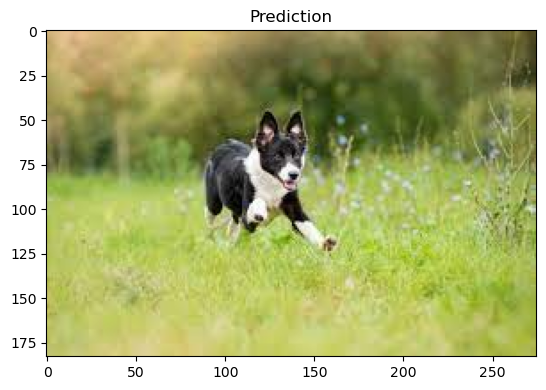

Prediction: a black dog is running in the grass.


In [100]:
image_path = 'dog_image.jpeg'
prediction = predict_image(model, image_path, tokenizer)

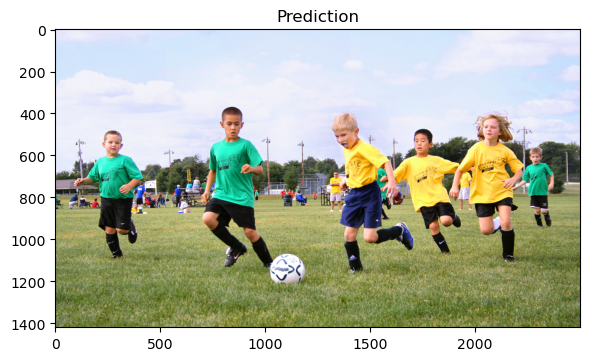

Prediction: a group of young boys playing soccer.


In [159]:
image_path = 'soccer.jpg'
prediction = predict_image(model, image_path, tokenizer)

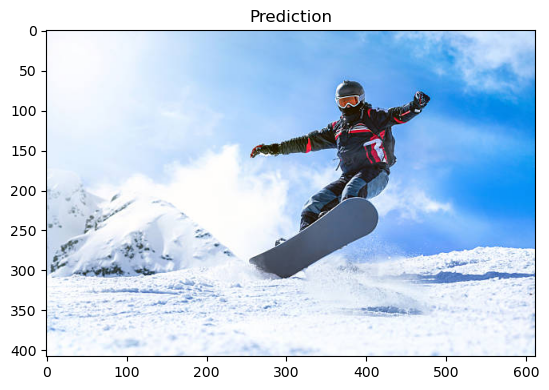

Prediction: a snowboarder is jumping over a snow covered hill.


In [173]:
image_path = 'man.jpg'
prediction = predict_image(model, image_path, tokenizer)

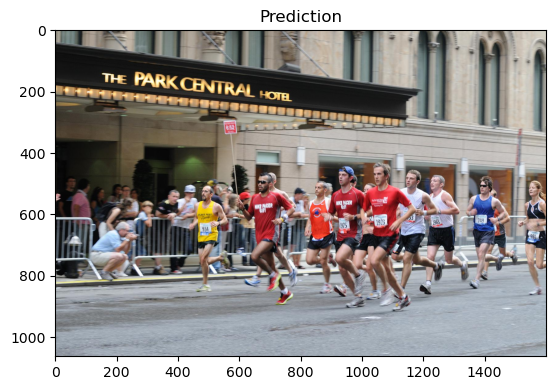

Prediction: a group of people are walking down a street.


In [211]:
# bad example
image_path = 'race.jpg'
prediction = predict_image(model, image_path, tokenizer)